In [4]:
!pip install pandas

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
import scipy as sp
import plotly.express as px
sns.set_theme(style='white',palette='muted')


In [3]:
url=r"C:\Users\sankara subramanian\Downloads\archive (2)\Amazon Sale Report.csv"
data=pd.read_csv(url)
df=pd.DataFrame(data)
df

,index,Order ID,Date,Status,Fulfilment,Sales Channel,ship-service-level,Style,SKU,Category,...,currency,Amount,ship-city,ship-state,ship-postal-code,ship-country,promotion-ids,B2B,fulfilled-by,Unnamed: 22
0,0,405-8078784-5731545,04-30-22,Cancelled,Merchant,Amazon.in,Standard,SET389,SET389-KR-NP-S,Set,...,INR,647.62,MUMBAI,MAHARASHTRA,400081.0,IN,NaN,False,Easy Ship,NaN
1,1,171-9198151-1101146,04-30-22,Shipped - Delivered to Buyer,Merchant,Amazon.in,Standard,JNE3781,JNE3781-KR-XXXL,kurta,...,INR,406.00,BENGALURU,KARNATAKA,560085.0,IN,Amazon PLCC Free-Financing Universal Merchant ...,False,Easy Ship,NaN
2,2,404-0687676-7273146,04-30-22,Shipped,Amazon,Amazon.in,Expedited,JNE3371,JNE3371-KR-XL,kurta,...,INR,329.00,NAVI MUMBAI,MAHARASHTRA,410210.0,IN,IN Core Free Shipping 2015/04/08 23-48-5-108,True,NaN,NaN
3,3,403-9615377-8133951,04-30-22,Cancelled,Merchant,Amazon.in,Standard,J0341,J0341-DR-L,Western Dress,...,INR,753.33,PUDUCHERRY,PUDUCHERRY,605008.0,IN,NaN,False,Easy Ship,NaN
4,4,407-1069790-7240320,04-30-22,Shipped,Amazon,Amazon.in,Expedited,JNE3671,JNE3671-TU-XXXL,Top,...,INR,574.00,CHENNAI,TAMIL NADU,600073.0,IN,NaN,False,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128970,128970,406-6001380-7673107,05-31-22,Shipped,Amazon,Amazon.in,Expedited,JNE3697,JNE3697-KR-XL,kurta,...,INR,517.00,HYDERABAD,TELANGANA,500013.0,IN,NaN,False,NaN,False
128971,128971,402-9551604-7544318,05-31-22,Shipped,Amazon,Amazon.in,Expedited,SET401,SET401-KR-NP-M,Set,...,INR,999.00,GURUGRAM,HARYANA,122004.0,IN,IN Core Free Shipping 2015/04/08 23-48-5-108,False,NaN,False
128972,128972,407-9547469-3152358,05-31-22,Shipped,Amazon,Amazon.in,Expedited,J0157,J0157-DR-XXL,Western Dress,...,INR,690.00,HYDERABAD,TELANGANA,500049.0,IN,NaN,False,NaN,False
128973,128973,402-6184140-0545956,05-31-22,Shipped,Amazon,Amazon.in,Expedited,J0012,J0012-SKD-XS,Set,...,INR,1199.00,Halol,Gujarat,389350.0,IN,IN Core Free Shipping 2015/04/08 23-48-5-108,False,NaN,False


In [4]:
df.shape

(128975, 24)

In [5]:
df.nunique().to_frame(name='Count of Unique values')

,Count of Unique values
index,128975
Order ID,120378
Date,91
Status,13
Fulfilment,2
Sales Channel,2
ship-service-level,2
Style,1377
SKU,7195
Category,9


In [6]:
df.describe()

,index,Qty,Amount,ship-postal-code
count,128975.000000,128975.000000,121180.000000,128942.000000
mean,64487.000000,0.904431,648.561465,463966.236509
std,37232.019822,0.313354,281.211687,191476.764941
min,0.000000,0.000000,0.000000,110001.000000
25%,32243.500000,1.000000,449.000000,382421.000000
50%,64487.000000,1.000000,605.000000,500033.000000
75%,96730.500000,1.000000,788.000000,600024.000000
max,128974.000000,15.000000,5584.000000,989898.000000


From this the average Purchase amount is rupees 648

The Max amount of purchase is 5584 rupees

In [7]:
df.isnull().sum().to_frame(name='Null values')

,Null values
index,0
Order ID,0
Date,0
Status,0
Fulfilment,0
Sales Channel,0
ship-service-level,0
Style,0
SKU,0
Category,0


In [37]:
from ydata_profiling import ProfileReport
profile= ProfileReport(df=df)
profile.to_file(output_file='Pre profile report.html')

Export report to file: 100%|██████████| 1/1 [00:00<00:00, 51.18it/s]


In [9]:
df.columns

Index(['index', 'Order ID', 'Date', 'Status', 'Fulfilment', 'Sales Channel ',
       'ship-service-level', 'Style', 'SKU', 'Category', 'Size', 'ASIN',
       'Courier Status', 'Qty', 'currency', 'Amount', 'ship-city',
       'ship-state', 'ship-postal-code', 'ship-country', 'promotion-ids',
       'B2B', 'fulfilled-by', 'Unnamed: 22'],
      dtype='object')

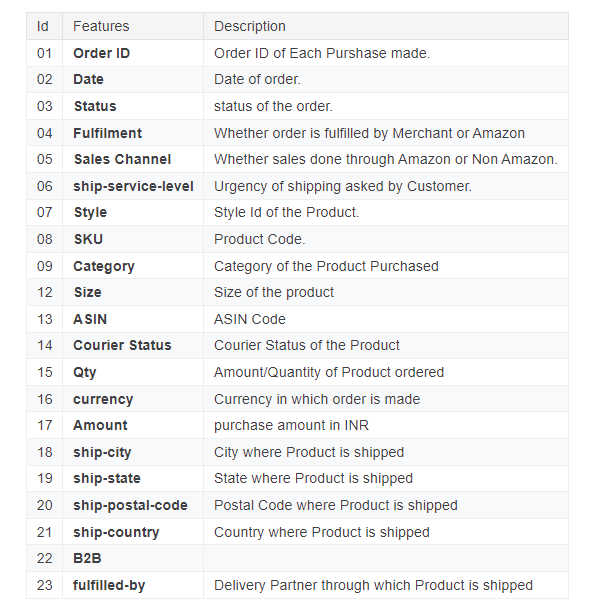


In [4]:
df.drop(columns=['Unnamed: 22','fulfilled-by','ship-country','currency','Sales Channel ','promotion-ids'], inplace=True)

In [5]:
selected=df.iloc[:,10:15]
selected

,ASIN,Courier Status,Qty,Amount,ship-city
0,B09KXVBD7Z,NaN,0,647.62,MUMBAI
1,B09K3WFS32,Shipped,1,406.00,BENGALURU
2,B07WV4JV4D,Shipped,1,329.00,NAVI MUMBAI
3,B099NRCT7B,NaN,0,753.33,PUDUCHERRY
4,B098714BZP,Shipped,1,574.00,CHENNAI
...,...,...,...,...,...
128970,B098112V2V,Shipped,1,517.00,HYDERABAD
128971,B09VC6KHX8,Shipped,1,999.00,GURUGRAM
128972,B0982YZ51B,Shipped,1,690.00,HYDERABAD
128973,B0894Y2NJQ,Shipped,1,1199.00,Halol


In [8]:
df.columns

Index(['index', 'Order ID', 'Date', 'Status', 'Fulfilment',
       'ship-service-level', 'Style', 'SKU', 'Category', 'Size', 'ASIN',
       'Courier Status', 'Qty', 'Amount', 'ship-city', 'ship-state',
       'ship-postal-code', 'B2B'],
      dtype='object')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128975 entries, 0 to 128974
Data columns (total 24 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   index               128975 non-null  int64  
 1   Order ID            128975 non-null  object 
 2   Date                128975 non-null  object 
 3   Status              128975 non-null  object 
 4   Fulfilment          128975 non-null  object 
 5   Sales Channel       128975 non-null  object 
 6   ship-service-level  128975 non-null  object 
 7   Style               128975 non-null  object 
 8   SKU                 128975 non-null  object 
 9   Category            128975 non-null  object 
 10  Size                128975 non-null  object 
 11  ASIN                128975 non-null  object 
 12  Courier Status      122103 non-null  object 
 13  Qty                 128975 non-null  int64  
 14  currency            121180 non-null  object 
 15  Amount              121180 non-nul

In [9]:
df.columns.str.capitalize()

Index(['Index', 'Order id', 'Date', 'Status', 'Fulfilment',
       'Ship-service-level', 'Style', 'Sku', 'Category', 'Size', 'Asin',
       'Courier status', 'Qty', 'Amount', 'Ship-city', 'Ship-state',
       'Ship-postal-code', 'B2b'],
      dtype='object')

In [10]:
df.isnull().sum()

index                    0
Order ID                 0
Date                     0
Status                   0
Fulfilment               0
ship-service-level       0
Style                    0
SKU                      0
Category                 0
Size                     0
ASIN                     0
Courier Status        6872
Qty                      0
Amount                7795
ship-city               33
ship-state              33
ship-postal-code        33
B2B                      0
dtype: int64

5935-cancelled
109487- shipped
6681=Unshipped 


In [5]:
df['Courier Status'].isnull().sum()

6872

In [6]:
df['Courier Status'].fillna('unknown',inplace=True)


In [7]:
df['ship-service-level'].unique()

array(['Standard', 'Expedited'], dtype=object)

In [12]:
df.isnull().sum()

index                     0
Order ID                  0
Date                      0
Status                    0
Fulfilment                0
Sales Channel             0
ship-service-level        0
Style                     0
SKU                       0
Category                  0
Size                      0
ASIN                      0
Courier Status            0
Qty                       0
currency               7795
Amount                 7795
ship-city                33
ship-state               33
ship-postal-code         33
ship-country             33
promotion-ids         49153
B2B                       0
fulfilled-by          89698
Unnamed: 22           49050
dtype: int64

In [13]:
df['ship-state'].unique()

array(['MAHARASHTRA', 'KARNATAKA', 'PUDUCHERRY', 'TAMIL NADU',
       'UTTAR PRADESH', 'CHANDIGARH', 'TELANGANA', 'ANDHRA PRADESH',
       'RAJASTHAN', 'DELHI', 'HARYANA', 'ASSAM', 'JHARKHAND',
       'CHHATTISGARH', 'ODISHA', 'KERALA', 'MADHYA PRADESH',
       'WEST BENGAL', 'NAGALAND', 'Gujarat', 'UTTARAKHAND', 'BIHAR',
       'JAMMU & KASHMIR', 'PUNJAB', 'HIMACHAL PRADESH',
       'ARUNACHAL PRADESH', 'MANIPUR', 'Goa', 'MEGHALAYA', 'GOA',
       'TRIPURA', 'LADAKH', 'DADRA AND NAGAR', 'SIKKIM', 'Delhi', nan,
       'ANDAMAN & NICOBAR ', 'Punjab', 'Rajshthan', 'Manipur',
       'rajasthan', 'Odisha', 'NL', 'Bihar', 'MIZORAM', 'punjab',
       'New Delhi', 'Rajasthan', 'Punjab/Mohali/Zirakpur', 'Puducherry',
       'delhi', 'RJ', 'Chandigarh', 'orissa', 'LAKSHADWEEP', 'goa', 'PB',
       'APO', 'Arunachal Pradesh', 'AR', 'Pondicherry', 'Sikkim',
       'Arunachal pradesh', 'Nagaland', 'bihar', 'Mizoram', 'rajsthan',
       'Orissa', 'Rajsthan', 'Meghalaya'], dtype=object)

In [8]:
# Group-based median imputation
df['Amount'] = df.groupby('Category')['Amount'].transform(lambda x: x.fillna(x.median()))

The amount is filled with median based on the category

In [9]:
df['Amount'].isnull().sum()

0

In [10]:
df.dropna(subset=['ship-city', 'ship-state', 'ship-postal-code'], inplace=True)


The ship city,state,Postal code is dropped which is of no use and can't impute with mode because it gives mismatches b/w state and city

In [56]:
df.columns

Index(['index', 'Order ID', 'Date', 'Status', 'Fulfilment',
       'ship-service-level', 'Style', 'SKU', 'Category', 'Size', 'ASIN',
       'Courier Status', 'Qty', 'Amount', 'ship-city', 'ship-state',
       'ship-postal-code', 'B2B'],
      dtype='object')

In [11]:
mappings={'ship-service-level':'Ship-Service','Category':'Product','ship-city':
          'City','ship-state':'State','ship-postal-code':'Zip code','B2B':'Customer-type'}
df.rename(columns=mappings,inplace=True)

In [12]:
df['Customer-type'].replace(to_replace=[True,False],value=['Business','Customer'],inplace=True)

In [13]:
df['Date']=pd.to_datetime(df['Date'])

In [14]:
df['Month']=df['Date'].dt.month


In [15]:
print(f'The earliest date is {df['Date'].min()}')
print(f'The latest date is {df['Date'].max()}')

The earliest date is 2022-03-31 00:00:00
The latest date is 2022-06-29 00:00:00


It is the data of amazon sales from Mar 31 to Jun 29 in 2022

In [20]:
df[df['State']=='APO']

,index,Order ID,Date,Status,Fulfilment,Ship-Service,Style,SKU,Product,Size,ASIN,Courier Status,Qty,Amount,City,State,Zip code,Customer-type,Month
45187,45187,405-0034289-0259545,2022-04-03,Cancelled,Amazon,Expedited,J0077,J0077-SKD-S,Set,S,B08YNTF3X3,Cancelled,0,788.0,APO,APO,959121.0,Customer,4


In [16]:
df['State']=df["State"].str.upper()
df['State'].unique()

array(['MAHARASHTRA', 'KARNATAKA', 'PUDUCHERRY', 'TAMIL NADU',
       'UTTAR PRADESH', 'CHANDIGARH', 'TELANGANA', 'ANDHRA PRADESH',
       'RAJASTHAN', 'DELHI', 'HARYANA', 'ASSAM', 'JHARKHAND',
       'CHHATTISGARH', 'ODISHA', 'KERALA', 'MADHYA PRADESH',
       'WEST BENGAL', 'NAGALAND', 'GUJARAT', 'UTTARAKHAND', 'BIHAR',
       'JAMMU & KASHMIR', 'PUNJAB', 'HIMACHAL PRADESH',
       'ARUNACHAL PRADESH', 'MANIPUR', 'GOA', 'MEGHALAYA', 'TRIPURA',
       'LADAKH', 'DADRA AND NAGAR', 'SIKKIM', 'ANDAMAN & NICOBAR ',
       'RAJSHTHAN', 'NL', 'MIZORAM', 'NEW DELHI',
       'PUNJAB/MOHALI/ZIRAKPUR', 'RJ', 'ORISSA', 'LAKSHADWEEP', 'PB',
       'APO', 'AR', 'PONDICHERRY', 'RAJSTHAN'], dtype=object)

In [17]:
mapp={'PONDICHERRY':'PUDUCHERRY',
      'RJ':'RAJASTHAN',
      'RAJSHTHAN':'RAJASTHAN',
      'RAJSTHAN':'RAJASTHAN',
      'NEW DELHI':'DELHI',
      'ORISSA':'ODISHA',
      'NL':'NAGALAND',
      'PB':'PUNJAB',
      'PUNJAB/MOHALI/ZIRAKPUR':'PUNJAB',
      'AR':'ARUNACHAL PRADESH'}
df['State']=df['State'].replace(mapp)
df['State'].unique()

array(['MAHARASHTRA', 'KARNATAKA', 'PUDUCHERRY', 'TAMIL NADU',
       'UTTAR PRADESH', 'CHANDIGARH', 'TELANGANA', 'ANDHRA PRADESH',
       'RAJASTHAN', 'DELHI', 'HARYANA', 'ASSAM', 'JHARKHAND',
       'CHHATTISGARH', 'ODISHA', 'KERALA', 'MADHYA PRADESH',
       'WEST BENGAL', 'NAGALAND', 'GUJARAT', 'UTTARAKHAND', 'BIHAR',
       'JAMMU & KASHMIR', 'PUNJAB', 'HIMACHAL PRADESH',
       'ARUNACHAL PRADESH', 'MANIPUR', 'GOA', 'MEGHALAYA', 'TRIPURA',
       'LADAKH', 'DADRA AND NAGAR', 'SIKKIM', 'ANDAMAN & NICOBAR ',
       'MIZORAM', 'LAKSHADWEEP', 'APO'], dtype=object)

In [18]:
df['Month_name']=df['Date'].dt.strftime('%B')
df

,index,Order ID,Date,Status,Fulfilment,Ship-Service,Style,SKU,Product,Size,ASIN,Courier Status,Qty,Amount,City,State,Zip code,Customer-type,Month,Month_name
0,0,405-8078784-5731545,2022-04-30,Cancelled,Merchant,Standard,SET389,SET389-KR-NP-S,Set,S,B09KXVBD7Z,unknown,0,647.62,MUMBAI,MAHARASHTRA,400081.0,Customer,4,April
1,1,171-9198151-1101146,2022-04-30,Shipped - Delivered to Buyer,Merchant,Standard,JNE3781,JNE3781-KR-XXXL,kurta,3XL,B09K3WFS32,Shipped,1,406.00,BENGALURU,KARNATAKA,560085.0,Customer,4,April
2,2,404-0687676-7273146,2022-04-30,Shipped,Amazon,Expedited,JNE3371,JNE3371-KR-XL,kurta,XL,B07WV4JV4D,Shipped,1,329.00,NAVI MUMBAI,MAHARASHTRA,410210.0,Business,4,April
3,3,403-9615377-8133951,2022-04-30,Cancelled,Merchant,Standard,J0341,J0341-DR-L,Western Dress,L,B099NRCT7B,unknown,0,753.33,PUDUCHERRY,PUDUCHERRY,605008.0,Customer,4,April
4,4,407-1069790-7240320,2022-04-30,Shipped,Amazon,Expedited,JNE3671,JNE3671-TU-XXXL,Top,3XL,B098714BZP,Shipped,1,574.00,CHENNAI,TAMIL NADU,600073.0,Customer,4,April
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128970,128970,406-6001380-7673107,2022-05-31,Shipped,Amazon,Expedited,JNE3697,JNE3697-KR-XL,kurta,XL,B098112V2V,Shipped,1,517.00,HYDERABAD,TELANGANA,500013.0,Customer,5,May
128971,128971,402-9551604-7544318,2022-05-31,Shipped,Amazon,Expedited,SET401,SET401-KR-NP-M,Set,M,B09VC6KHX8,Shipped,1,999.00,GURUGRAM,HARYANA,122004.0,Customer,5,May
128972,128972,407-9547469-3152358,2022-05-31,Shipped,Amazon,Expedited,J0157,J0157-DR-XXL,Western Dress,XXL,B0982YZ51B,Shipped,1,690.00,HYDERABAD,TELANGANA,500049.0,Customer,5,May
128973,128973,402-6184140-0545956,2022-05-31,Shipped,Amazon,Expedited,J0012,J0012-SKD-XS,Set,XS,B0894Y2NJQ,Shipped,1,1199.00,Halol,GUJARAT,389350.0,Customer,5,May


In [20]:
df['State'].unique()

array(['MAHARASHTRA', 'KARNATAKA', 'PUDUCHERRY', 'TAMIL NADU',
       'UTTAR PRADESH', 'CHANDIGARH', 'TELANGANA', 'ANDHRA PRADESH',
       'RAJASTHAN', 'DELHI', 'HARYANA', 'ASSAM', 'JHARKHAND',
       'CHHATTISGARH', 'ODISHA', 'KERALA', 'MADHYA PRADESH',
       'WEST BENGAL', 'NAGALAND', 'GUJARAT', 'UTTARAKHAND', 'BIHAR',
       'JAMMU & KASHMIR', 'PUNJAB', 'HIMACHAL PRADESH',
       'ARUNACHAL PRADESH', 'MANIPUR', 'GOA', 'MEGHALAYA', 'TRIPURA',
       'LADAKH', 'DADRA AND NAGAR', 'SIKKIM', 'ANDAMAN & NICOBAR ',
       'MIZORAM', 'LAKSHADWEEP', 'APO'], dtype=object)

1.What were the top 3 states with highest average amount?

In [19]:
average=df.groupby('State').agg({'Amount':'mean'}).sort_values('Amount',ascending=False).reset_index()
St_amt=pd.DataFrame(average)
St_amt.head(3)

,State,Amount
0,LADAKH,911.079767
1,NAGALAND,794.880588
2,LAKSHADWEEP,793.822500


## Observation: Ladakh has max average of amount which is rupees: 911.079767

2.Top 3 cities with highest revenue generated?

In [20]:
top_states=df.groupby('City').agg({'Amount':'sum'}).sort_values('Amount',ascending=False).reset_index()
top_states.head(3)

,City,Amount
0,BENGALURU,7177327.99
1,HYDERABAD,5233382.67
2,MUMBAI,3863413.90


3.What is the total revenue generated month wise ?

In [ ]:
Month_sales=df.groupby('Month_name').agg({'Amount':'sum'}).reset_index()
Month_sales

,Month_name,Amount
0,April,30692940.97
1,June,24827171.53
2,March,108069.85
3,May,27797113.80


April month generated more revenue because Amazon held a Weekend Refresh Sale for fashion on April 14–15, 2022 in India. Amazon also released new data in April 2022, including search volume data and Add to Card data, in the Search Query/Catalog Performance Report. 


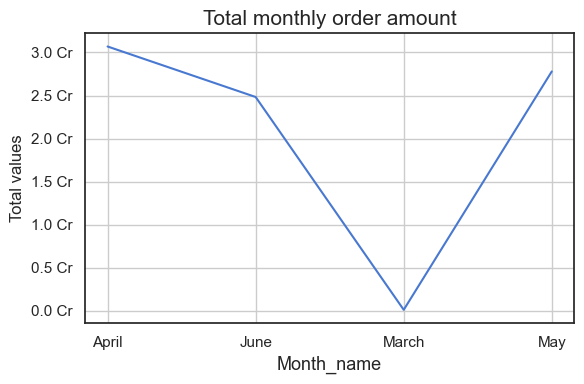

In [35]:
from matplotlib.ticker import FuncFormatter
def format_crore(value, pos):
    return f'{value/1e7:.1f} Cr'
fig,ax=plt.subplots(figsize=(6,4))
sns.lineplot(data=Month_sales,x='Month_name',y='Amount',ax=ax)
ax.yaxis.set_major_formatter(FuncFormatter(format_crore))
plt.xticks(rotation=0)
plt.title('Total monthly order amount',size=15)
plt.xlabel('Month_name',fontsize=13)
plt.ylabel('Total values',fontsize=12)
plt.grid(linestyle='-')
plt.tight_layout()
plt.show()

In [24]:
df.head()

,index,Order ID,Date,Status,Fulfilment,Ship-Service,Style,SKU,Product,Size,ASIN,Courier Status,Qty,Amount,City,State,Zip code,Customer-type,Month,Month_name
0,0,405-8078784-5731545,2022-04-30,Cancelled,Merchant,Standard,SET389,SET389-KR-NP-S,Set,S,B09KXVBD7Z,unknown,0,647.62,MUMBAI,MAHARASHTRA,400081.0,Customer,4,April
1,1,171-9198151-1101146,2022-04-30,Shipped - Delivered to Buyer,Merchant,Standard,JNE3781,JNE3781-KR-XXXL,kurta,3XL,B09K3WFS32,Shipped,1,406.00,BENGALURU,KARNATAKA,560085.0,Customer,4,April
2,2,404-0687676-7273146,2022-04-30,Shipped,Amazon,Expedited,JNE3371,JNE3371-KR-XL,kurta,XL,B07WV4JV4D,Shipped,1,329.00,NAVI MUMBAI,MAHARASHTRA,410210.0,Business,4,April
3,3,403-9615377-8133951,2022-04-30,Cancelled,Merchant,Standard,J0341,J0341-DR-L,Western Dress,L,B099NRCT7B,unknown,0,753.33,PUDUCHERRY,PUDUCHERRY,605008.0,Customer,4,April
4,4,407-1069790-7240320,2022-04-30,Shipped,Amazon,Expedited,JNE3671,JNE3671-TU-XXXL,Top,3XL,B098714BZP,Shipped,1,574.00,CHENNAI,TAMIL NADU,600073.0,Customer,4,April


In [37]:
df['State'].unique()

array(['MAHARASHTRA', 'KARNATAKA', 'PUDUCHERRY', 'TAMIL NADU',
       'UTTAR PRADESH', 'CHANDIGARH', 'TELANGANA', 'ANDHRA PRADESH',
       'RAJASTHAN', 'DELHI', 'HARYANA', 'ASSAM', 'JHARKHAND',
       'CHHATTISGARH', 'ODISHA', 'KERALA', 'MADHYA PRADESH',
       'WEST BENGAL', 'NAGALAND', 'GUJARAT', 'UTTARAKHAND', 'BIHAR',
       'JAMMU & KASHMIR', 'PUNJAB', 'HIMACHAL PRADESH',
       'ARUNACHAL PRADESH', 'MANIPUR', 'GOA', 'MEGHALAYA', 'TRIPURA',
       'LADAKH', 'DADRA AND NAGAR', 'SIKKIM', 'ANDAMAN & NICOBAR ',
       'MIZORAM', 'LAKSHADWEEP', 'APO'], dtype=object)

In [38]:
df['Product'].unique()

array(['Set', 'kurta', 'Western Dress', 'Top', 'Ethnic Dress', 'Bottom',
       'Saree', 'Blouse', 'Dupatta'], dtype=object)

To know about the shipping details keenly through user input

In [32]:
state=input()
Product=input()
set_data=df[(df['Product']==Product) & (df['State']==state)]

fig1=px.pie(set_data,values='Amount',names='Status',title=f'Product status of {Product} in {state}',hover_data={'City':True},height=500)
fig1.show()

4.What is the most sold product within this 3 months ?

In [22]:
fig=px.pie(df,values='Amount',names='Product',title='Sales distribution of products')
fig.show()

 This pie chart shows that the people prefer set the most and kurtaas second 

In [37]:
df.columns

Index(['index', 'Order ID', 'Date', 'Status', 'Fulfilment', 'Ship-Service',
       'Style', 'SKU', 'Product', 'Size', 'ASIN', 'Courier Status', 'Qty',
       'Amount', 'City', 'State', 'Zip code', 'Customer-type', 'Month',
       'Month_name'],
      dtype='object')

In [23]:
plot = px.line(df, x='Amount', y='Product', color='Product',title='Price distribution of each products')
plot.show()

In [24]:
sl=df.groupby('State').agg({'Amount':'mean'}).reset_index()
sl

,State,Amount
0,ANDAMAN & NICOBAR,655.893463
1,ANDHRA PRADESH,634.795427
2,APO,788.000000
3,ARUNACHAL PRADESH,705.693878
4,ASSAM,654.204239
5,BIHAR,718.361268
6,CHANDIGARH,668.041051
7,CHHATTISGARH,659.584136
8,DADRA AND NAGAR,674.271714
9,DELHI,661.026974


In [25]:
sales = px.bar(sl,x='Amount', y='State', color='State', width=1000, height=1000)
sales.show()


# Top 3 states with max average of sales
## 1 Ladakh UT
## 2 Nagaland
## 3 Lakshadweep UT


In [57]:
df.head()

,index,Order ID,Date,Status,Fulfilment,Ship-Service,Style,SKU,Product,Size,ASIN,Courier Status,Qty,Amount,City,State,Zip code,Customer-type,Month,Month_name
0,0,405-8078784-5731545,2022-04-30,Cancelled,Merchant,Standard,SET389,SET389-KR-NP-S,Set,S,B09KXVBD7Z,unknown,0,647.62,MUMBAI,MAHARASHTRA,400081.0,Customer,4,April
1,1,171-9198151-1101146,2022-04-30,Shipped - Delivered to Buyer,Merchant,Standard,JNE3781,JNE3781-KR-XXXL,kurta,3XL,B09K3WFS32,Shipped,1,406.00,BENGALURU,KARNATAKA,560085.0,Customer,4,April
2,2,404-0687676-7273146,2022-04-30,Shipped,Amazon,Expedited,JNE3371,JNE3371-KR-XL,kurta,XL,B07WV4JV4D,Shipped,1,329.00,NAVI MUMBAI,MAHARASHTRA,410210.0,Business,4,April
3,3,403-9615377-8133951,2022-04-30,Cancelled,Merchant,Standard,J0341,J0341-DR-L,Western Dress,L,B099NRCT7B,unknown,0,753.33,PUDUCHERRY,PUDUCHERRY,605008.0,Customer,4,April
4,4,407-1069790-7240320,2022-04-30,Shipped,Amazon,Expedited,JNE3671,JNE3671-TU-XXXL,Top,3XL,B098714BZP,Shipped,1,574.00,CHENNAI,TAMIL NADU,600073.0,Customer,4,April


In [42]:
df[df['Amount']==5584]

,index,Order ID,Date,Status,Fulfilment,Ship-Service,Style,SKU,Product,Size,ASIN,Courier Status,Qty,Amount,City,State,Zip code,Customer-type,Month,Month_name
42039,42039,402-5239558-4281957,2022-04-05,Shipped,Amazon,Expedited,SET268,SET268-KR-NP-XS,Set,XS,B08XQBXFPP,Shipped,8,5584.0,GUNTUR,ANDHRA PRADESH,522007.0,Customer,4,April


# The max amount of Sale was 5584 rupees in Guntur Andhra Pradhesh on April 05th 2022. The set size they have bought was XS which is a rare size which is meant for children.

In [44]:
df.head()

,index,Order ID,Date,Status,Fulfilment,Sales Channel,Ship-Service,Style,SKU,Product,...,City,State,Zip code,ship-country,promotion-ids,Customer-type,fulfilled-by,Unnamed: 22,Month,Month_name
0,0,405-8078784-5731545,2022-04-30,Cancelled,Merchant,Amazon.in,Standard,SET389,SET389-KR-NP-S,Set,...,MUMBAI,MAHARASHTRA,400081.0,IN,NaN,Customer,Easy Ship,NaN,4,April
1,1,171-9198151-1101146,2022-04-30,Shipped - Delivered to Buyer,Merchant,Amazon.in,Standard,JNE3781,JNE3781-KR-XXXL,kurta,...,BENGALURU,KARNATAKA,560085.0,IN,Amazon PLCC Free-Financing Universal Merchant ...,Customer,Easy Ship,NaN,4,April
2,2,404-0687676-7273146,2022-04-30,Shipped,Amazon,Amazon.in,Expedited,JNE3371,JNE3371-KR-XL,kurta,...,NAVI MUMBAI,MAHARASHTRA,410210.0,IN,IN Core Free Shipping 2015/04/08 23-48-5-108,Business,NaN,NaN,4,April
3,3,403-9615377-8133951,2022-04-30,Cancelled,Merchant,Amazon.in,Standard,J0341,J0341-DR-L,Western Dress,...,PUDUCHERRY,PUDUCHERRY,605008.0,IN,NaN,Customer,Easy Ship,NaN,4,April
4,4,407-1069790-7240320,2022-04-30,Shipped,Amazon,Amazon.in,Expedited,JNE3671,JNE3671-TU-XXXL,Top,...,CHENNAI,TAMIL NADU,600073.0,IN,NaN,Customer,NaN,NaN,4,April


5.What type of Customer generated more average ?

In [26]:
customer_ty=df.groupby('Customer-type').agg({'Amount':'mean'}).reset_index()
customer_ty

,Customer-type,Amount
0,Business,699.906820
1,Customer,646.638797


In [27]:
plot=px.bar(data_frame=customer_ty,x='Customer-type',y='Amount',color='Customer-type', height=400, width=400)
plot.show()

Business type has higher average compared to customer type 

In [42]:
df.head()

,index,Order ID,Date,Status,Fulfilment,Ship-Service,Style,SKU,Product,Size,ASIN,Courier Status,Qty,Amount,City,State,Zip code,Customer-type,Month,Month_name
0,0,405-8078784-5731545,2022-04-30,Cancelled,Merchant,Standard,SET389,SET389-KR-NP-S,Set,S,B09KXVBD7Z,unknown,0,647.62,MUMBAI,MAHARASHTRA,400081.0,Customer,4,April
1,1,171-9198151-1101146,2022-04-30,Shipped - Delivered to Buyer,Merchant,Standard,JNE3781,JNE3781-KR-XXXL,kurta,3XL,B09K3WFS32,Shipped,1,406.00,BENGALURU,KARNATAKA,560085.0,Customer,4,April
2,2,404-0687676-7273146,2022-04-30,Shipped,Amazon,Expedited,JNE3371,JNE3371-KR-XL,kurta,XL,B07WV4JV4D,Shipped,1,329.00,NAVI MUMBAI,MAHARASHTRA,410210.0,Business,4,April
3,3,403-9615377-8133951,2022-04-30,Cancelled,Merchant,Standard,J0341,J0341-DR-L,Western Dress,L,B099NRCT7B,unknown,0,753.33,PUDUCHERRY,PUDUCHERRY,605008.0,Customer,4,April
4,4,407-1069790-7240320,2022-04-30,Shipped,Amazon,Expedited,JNE3671,JNE3671-TU-XXXL,Top,3XL,B098714BZP,Shipped,1,574.00,CHENNAI,TAMIL NADU,600073.0,Customer,4,April


In [40]:
df.iloc[:,3:7]

,Status,Fulfilment,Ship-Service,Style
0,Cancelled,Merchant,Standard,SET389
1,Shipped - Delivered to Buyer,Merchant,Standard,JNE3781
2,Shipped,Amazon,Expedited,JNE3371
3,Cancelled,Merchant,Standard,J0341
4,Shipped,Amazon,Expedited,JNE3671
...,...,...,...,...
128970,Shipped,Amazon,Expedited,JNE3697
128971,Shipped,Amazon,Expedited,SET401
128972,Shipped,Amazon,Expedited,J0157
128973,Shipped,Amazon,Expedited,J0012


In [54]:
top_city_revenue=df.groupby('City').agg({'Amount':'sum'}).sort_values('Amount',ascending=False).reset_index().head(4)
top_city_revenue

,City,Amount
0,BENGALURU,7177327.99
1,HYDERABAD,5233382.67
2,MUMBAI,3863413.90
3,NEW DELHI,3838950.48


It shows the diversity of amount at different cities 

In [43]:
top_city_orders=df.groupby('City').agg({'Amount':'nunique'}).sort_values('Amount',ascending=False).reset_index().head(4)
top_city_orders

,City,Amount
0,BENGALURU,744
1,HYDERABAD,691
2,NEW DELHI,630
3,MUMBAI,625


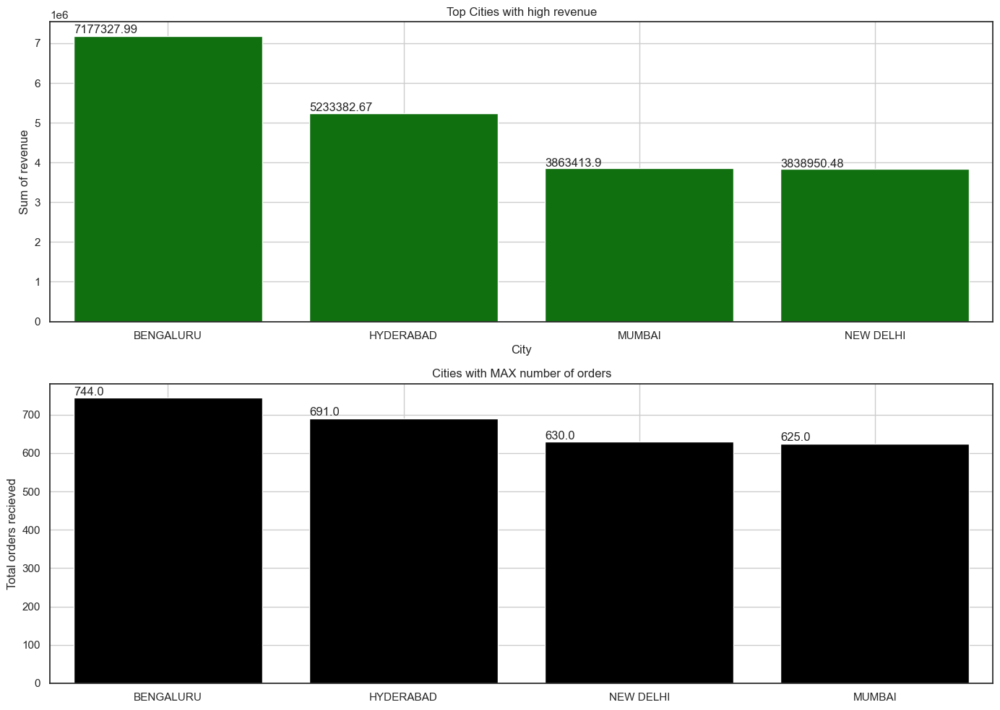

In [49]:
fig,ax0=plt.subplots(2,1,figsize=(14,10))
ax1=ax0[0]
ax2=ax0[1]
sns.barplot(data=top_city_revenue,x='City',y='Amount',ax=ax1,color='green')
sns.barplot(data=top_city_orders,x='City',y='Amount',ax=ax2,color='black')
plt.xticks(rotation=0)
plt.xlabel(None)
ax1.set_ylabel('Sum of revenue')
ax2.set_ylabel('Total orders recieved')
ax1.set_title('Top Cities with high revenue')
ax2.set_title('Cities with MAX number of orders')
ax1.grid(linestyle='-')
ax2.grid(linestyle='-')

for chart in ax1.patches:
    bar_height=chart.get_height()
    bar_height_f=round(bar_height/1,2)
    bar_x=chart.get_x()
    ax1.annotate(text=bar_height_f,xy=(bar_x,bar_height*1.01))


for chart in ax2.patches:
    bar_height=chart.get_height()
    bar_height_f=round(bar_height/1,2)
    bar_x=chart.get_x()
    ax2.annotate(text=bar_height_f,xy=(bar_x,bar_height*1.01))
plt.tight_layout()

# Conclusion

- From this data about amazon sales from Mar 31 to Jun 29 in the year 2022 I have analysed in depth about the data and found some insights 
- The data had more unorganized values like missing values, spelling mistakes and unwanted colums. Those were cleaned and optimized.
- Same state name repeated with spelling mistakes which leads to bad info about data those were also corrected
## Insights we should concentrate on 

-  Top 3 states with max average of sales
    1 Ladakh UT
    2 Nagaland
    3 Lakshadweep UT. This shows that amazon have spreaded in every nook and corner of India 
- April month generated more revenue because Amazon held a Weekend Refresh Sale for fashion on April 14–15, 2022 in India. Amazon also released  new data in April 2022, including search volume data and Add to Card data, in the Search Query/Catalog Performance Report. This type of action makes more revenue it created demand for the next offer to launch.

- Product wise the SET has had about 50 percentage of revenue and then Kurta and western dresses.So we need to focus on Kurta and western dresses by giving offers during clearance and need to provide those with rare sizes like XS which will increase the revenue greatly 

One example I observed is - The max amount of Sale was 5584 rupees in Guntur Andhra Pradhesh on April 05th 2022. The set size they have bought was XS which is a rare size which is meant for children.

- Bangalore is the city with most orders and obviously revenues so the sales will be sustained so we need to work on the less revenue generating cities and to analyze them carefully about their needs and development.
We need to look for the urban plans of government which makes people more developed and accessable to digitalization.

